## Data Understanding and Preprocessing

In [1]:
import os
import cv2
import yaml
import random
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

In [2]:
# Define Dataset path

dataset1 = 'C:\\Users\\User\\OneDrive - Asia Pacific University\\APU\\Year 3\\FYP\\Dataset\\AccidentsDetection_rbfdataset'
dataset2 = 'C:\\Users\\User\\OneDrive - Asia Pacific University\\APU\\Year 3\\FYP\\Dataset\\car_accident_dataset.v1i.yolov8'

### 1. Components of Downloaded Datasets

In [3]:
dataset1_dir = os.listdir(dataset1)
print(f'Dataset 1 Files and Directories: {dataset1_dir}')

dataset2_dir = os.listdir(dataset2)
print(f'Dataset 2 Files and Directories: {dataset2_dir}')

Dataset 1 Files and Directories: ['data.yaml', 'README.dataset.txt', 'README.roboflow.txt', 'test', 'train', 'valid']
Dataset 2 Files and Directories: ['data.yaml', 'README.dataset.txt', 'README.roboflow.txt', 'test', 'train', 'valid']


### 2. Datasets Yaml File

- Dataset 1

In [4]:
# Dataset 1 Yaml File 
dataset1_yaml = os.path.join(dataset1,'data.yaml')

with open(dataset1_yaml, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- accident
nc: 1
roboflow:
  license: CC BY 4.0
  project: accidentsdetection
  url: https://universe.roboflow.com/accidents/accidentsdetection/dataset/6
  version: 6
  workspace: accidents
test: C:/Users/User/OneDrive - Asia Pacific University/APU/Year 3/FYP/Dataset/AccidentsDetection_rbfdataset/test/images
train: C:/Users/User/OneDrive - Asia Pacific University/APU/Year 3/FYP/Dataset/AccidentsDetection_rbfdataset/train/images
val: C:/Users/User/OneDrive - Asia Pacific University/APU/Year 3/FYP/Dataset/AccidentsDetection_rbfdataset/valid/images



- Dataset 2

In [5]:
# Dataset 2 Yaml File 
dataset2_yaml = os.path.join(dataset2,'data.yaml')

with open(dataset2_yaml, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- accident
nc: 1
roboflow:
  license: CC BY 4.0
  project: car_accident_dataset
  url: https://universe.roboflow.com/gourab-dl9ef/car_accident_dataset/dataset/1
  version: 1
  workspace: gourab-dl9ef
test: C:\\Users\\User\\OneDrive - Asia Pacific University\\APU\\Year 3\\FYP\\Dataset\\car_accident_dataset.v1i.yolov8\\test\\images
train: C:\\Users\\User\\OneDrive - Asia Pacific University\\APU\\Year 3\\FYP\\Dataset\\car_accident_dataset.v1i.yolov8\\train\\images
val: C:\\Users\\User\\OneDrive - Asia Pacific University\\APU\\Year 3\\FYP\\Dataset\\car_accident_dataset.v1i.yolov8\\valid\\images



### 3. Split Files (Train, Val, Test)

- Split File Structure

In [6]:
# define dataset 1 split files path
dataset1_train_path = os.path.join(dataset1,'train')
dataset1_valid_path = os.path.join(dataset1,'valid')
dataset1_test_path = os.path.join(dataset1,'test')

# define dataset 2 split files path
dataset2_train_path = os.path.join(dataset2,'train')
dataset2_valid_path = os.path.join(dataset2,'valid')
dataset2_test_path = os.path.join(dataset2,'test')

In [7]:
#show file dir of dataset 1
print('Dataset 1:')
dataset1_train_dir = os.listdir(dataset1_train_path)
print(f'Train: {dataset1_train_dir}')
dataset1_val_dir = os.listdir(dataset1_valid_path)
print(f'Valid: {dataset1_val_dir}')
dataset1_test_dir = os.listdir(dataset1_test_path)
print(f'Test: {dataset1_test_dir}')

Dataset 1:
Train: ['images', 'labels', 'labels.cache']
Valid: ['images', 'labels', 'labels.cache']
Test: ['images', 'labels']


In [8]:
#show file dir of dataset 1
print('Dataset 2:')
dataset2_train_dir = os.listdir(dataset2_train_path)
print(f'Train: {dataset2_train_dir}')
dataset2_val_dir = os.listdir(dataset2_valid_path)
print(f'Valid: {dataset2_val_dir}')
dataset2_test_dir = os.listdir(dataset2_test_path)
print(f'Test: {dataset2_test_dir}')

Dataset 2:
Train: ['images', 'labels', 'labels.cache']
Valid: ['images', 'labels', 'labels.cache']
Test: ['images', 'labels']


In [9]:
# define images and labels file for both datasets
# dataset 1

dataset1_train_images = os.path.join(dataset1_train_path,'images')
dataset1_train_labels = os.path.join(dataset1_train_path,'labels')

dataset1_val_images = os.path.join(dataset1_valid_path,'images')
dataset1_val_labels = os.path.join(dataset1_valid_path,'labels')

dataset1_test_images = os.path.join(dataset1_test_path,'images')
dataset1_test_labels = os.path.join(dataset1_test_path,'labels')

# dataset 2

dataset2_train_images = os.path.join(dataset2_train_path,'images')
dataset2_train_labels = os.path.join(dataset2_train_path,'labels')

dataset2_val_images = os.path.join(dataset2_valid_path,'images')
dataset2_val_labels = os.path.join(dataset2_valid_path,'labels')

dataset2_test_images = os.path.join(dataset2_test_path,'images')
dataset2_test_labels = os.path.join(dataset2_test_path,'labels')

#### 3.1 Images Count and Sizes

In [10]:
# Show sample images folder
dataset1_images_dir = os.listdir(dataset1_train_images)
for img_file in dataset1_images_dir:
    file_extension = Path(img_file).suffix
    print(img_file)

train_img_no_1.jpg
train_img_no_10.jpg
train_img_no_100.jpg
train_img_no_1000.jpg
train_img_no_1001.jpg
train_img_no_1002.jpg
train_img_no_1003.jpg
train_img_no_1004.jpg
train_img_no_1005.jpg
train_img_no_1006.jpg
train_img_no_1007.jpg
train_img_no_1008.jpg
train_img_no_1009.jpg
train_img_no_101.jpg
train_img_no_1010.jpg
train_img_no_1011.jpg
train_img_no_1012.jpg
train_img_no_1013.jpg
train_img_no_1014.jpg
train_img_no_1015.jpg
train_img_no_1016.jpg
train_img_no_1017.jpg
train_img_no_1018.jpg
train_img_no_1019.jpg
train_img_no_102.jpg
train_img_no_1020.jpg
train_img_no_1021.jpg
train_img_no_1022.jpg
train_img_no_1023.jpg
train_img_no_1024.jpg
train_img_no_1025.jpg
train_img_no_1026.jpg
train_img_no_1027.jpg
train_img_no_1028.jpg
train_img_no_1029.jpg
train_img_no_103.jpg
train_img_no_1030.jpg
train_img_no_1031.jpg
train_img_no_1032.jpg
train_img_no_1033.jpg
train_img_no_1034.jpg
train_img_no_1035.jpg
train_img_no_1036.jpg
train_img_no_1037.jpg
train_img_no_1038.jpg
train_img_no_1039.j

In [11]:
def check_images_sizes_and_count(split_images_path):
    image_sizes_set = set()
    images_count = 0

    for filename in os.listdir(split_images_path):
        if filename.endswith('.jpg'):  
            images_count += 1
            image_path = os.path.join(split_images_path, filename)
            with Image.open(image_path) as img:
                image_sizes_set.add(img.size)

    return image_sizes_set,images_count

def generate_images_info(train_images_path, valid_images_path, test_images_path):

    train_image_sizes, num_train_images = check_images_sizes_and_count(train_images_path)
    valid_image_sizes, num_valid_images = check_images_sizes_and_count(valid_images_path)
    test_image_sizes, num_test_images = check_images_sizes_and_count(test_images_path)

    total_images = num_train_images + num_valid_images + num_test_images

    # Print the results
    print(f"Number of training images: {num_train_images} ({round(num_train_images/total_images*100)}%)")
    print(f"Number of validation images: {num_valid_images} ({round(num_valid_images/total_images*100)}%)")
    print(f"Number of test images: {num_test_images} ({round(num_test_images/total_images*100)}%)")

    if len(train_image_sizes) == 1:
        print(f"All training images have the same size: {train_image_sizes.pop()}")
    else:
        print("Training images have varying sizes.")

    if len(valid_image_sizes) == 1:
        print(f"All validation images have the same size: {valid_image_sizes.pop()}")
    else:
        print("Validation images have varying sizes.")

    if len(test_image_sizes) == 1:
        print(f"All test images have the same size: {test_image_sizes.pop()}")
    else:
        print("test images have varying sizes.")

- Dataset 1

In [12]:
generate_images_info(dataset1_train_images,dataset1_val_images,dataset1_test_images)

Number of training images: 4878 (80%)
Number of validation images: 607 (10%)
Number of test images: 588 (10%)
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)
All test images have the same size: (640, 640)


- Dataset 2

In [13]:
generate_images_info(dataset2_train_images,dataset2_val_images,dataset2_test_images)

Number of training images: 7065 (81%)
Number of validation images: 1072 (12%)
Number of test images: 631 (7%)
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)
All test images have the same size: (640, 640)


#### 3.2 Images Labels

In [14]:
def show_labels_content(split_labels_path):
    split_labels_dir = os.listdir(split_labels_path)
    for file in split_labels_dir:
        file_path = os.path.join(split_labels_path,file)
        with open(file_path,'r') as _file:
            content = _file.read()
            print(f'{file}:')
            print(f'{content}\n')

In [15]:
# example label files (train) of Dataset 1 
show_labels_content(dataset1_train_labels)

train_img_no_1.txt:
0 0.54140625 0.3859375 0.1578125 0.08359375

train_img_no_10.txt:
0 0.2203125 0.553125 0.43828125 0.29609375

train_img_no_100.txt:
0 0.5 0.475 0.9796875 0.8703125

train_img_no_1000.txt:
0 0.4265625 0.45078125 0.46875 0.6796875

train_img_no_1001.txt:
0 0.45078125 0.46796875 0.13203125 0.1328125

train_img_no_1002.txt:
0 0.48828125 0.45703125 0.5625 0.5296875

train_img_no_1003.txt:
0 0.5484375 0.4875 0.35078125 0.7859375

train_img_no_1004.txt:
0 0.53984375 0.3546875 0.4640625 0.35859375

train_img_no_1005.txt:
0 0.62890625 0.43671875 0.5265625 0.55625

train_img_no_1006.txt:
0 0.7015625 0.3375 0.59140625 0.675
0 0.5 0.3421875 0.9953125 0.68359375
0 0.28828125 0.3546875 0.5765625 0.709375

train_img_no_1007.txt:
0 0.4953125 0.5015625 0.990625 0.996875

train_img_no_1008.txt:
0 0.61796875 0.45078125 0.759375 0.9015625

train_img_no_1009.txt:
0 0.52890625 0.528125 0.384375 0.61953125

train_img_no_101.txt:
0 0.4 0.565625 0.79296875 0.47578125

train_img_no_1010.txt:

In [16]:
# example label files (train) of Dataset 2 
show_labels_content(dataset2_train_labels)

train_img_no_1.txt:
0 0.63515625 0.2375 0.1671875 0.1890625

train_img_no_10.txt:
0 0.63515625 0.2375 0.1671875 0.1890625

train_img_no_100.txt:
0 0.27109375 0.66953125 0.3109375 0.3671875

train_img_no_1000.txt:
0 0.5609375 0.37578125 0.6 0.6203125

train_img_no_1001.txt:
0 0.4390625 0.37578125 0.6 0.6203125

train_img_no_1002.txt:
0 0.43046875 0.309375 0.3328125 0.3640625

train_img_no_1003.txt:
0 0.4984375 0.42265625 0.3375 0.1921875

train_img_no_1004.txt:
0 0.5015625 0.42265625 0.3375 0.1921875

train_img_no_1005.txt:
0 0.4984375 0.42265625 0.3375 0.1921875

train_img_no_1006.txt:
0 0.5015625 0.42265625 0.3375 0.1921875

train_img_no_1007.txt:
0 0.46875 0.38125 0.184375 0.1171875

train_img_no_1008.txt:
0 0.53125 0.38125 0.184375 0.1171875

train_img_no_1009.txt:
0 0.53125 0.38125 0.184375 0.1171875

train_img_no_101.txt:
0 0.72890625 0.66953125 0.3109375 0.3671875

train_img_no_1010.txt:
0 0.46875 0.38125 0.184375 0.1171875

train_img_no_1011.txt:
0 0.46875 0.38125 0.184375 0.117


YOLO Annotation Format for Bounding Boxes: [class_label] [X_Center] [Y_Center] [Width] [Height]

Class ID (0-indexed): An integer representing the class of the detected object. This number corresponds to the index of the class label in your dataset's class list. 

Center X (Normalized): A floating-point number between 0 and 1 indicating the normalized x-coordinate of the bounding box's center relative to the image width. (0,0) corresponds to the top-left corner of the image, and (1,1) corresponds to the bottom-right corner.

Center Y (Normalized): A floating-point number between 0 and 1 indicating the normalized y-coordinate of the bounding box's center relative to the image height.

Width (Normalized): A floating-point number between 0 and 1 representing the normalized width of the bounding box relative to the image width.

Height (Normalized): A floating-point number between 0 and 1 representing the normalized height of the bounding box relative to the image height.

### 4. Display Images

#### 4.1 Display Sample Images

In [17]:
def display_sample_images(images_path):
    image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

    # Randomly select 15 images
    random_images = random.sample(image_files, 30)

    # Create a new figure
    plt.figure(figsize=(20, 15))

    # Loop through each image and display it in a 5x6 grid
    for i, image_file in enumerate(random_images):
        image_path = os.path.join(images_path, image_file)
        image = Image.open(image_path)
        plt.subplot(5, 6, i + 1)
        plt.imshow(image)
        plt.axis('off')

    # Add a suptitle
    plt.suptitle('Random Selection of Dataset Images', fontsize=24)

    # Show the plot
    plt.tight_layout()
    plt.show()

    # Deleting unnecessary variable to free up memory
    del image_files

- Dataset 1

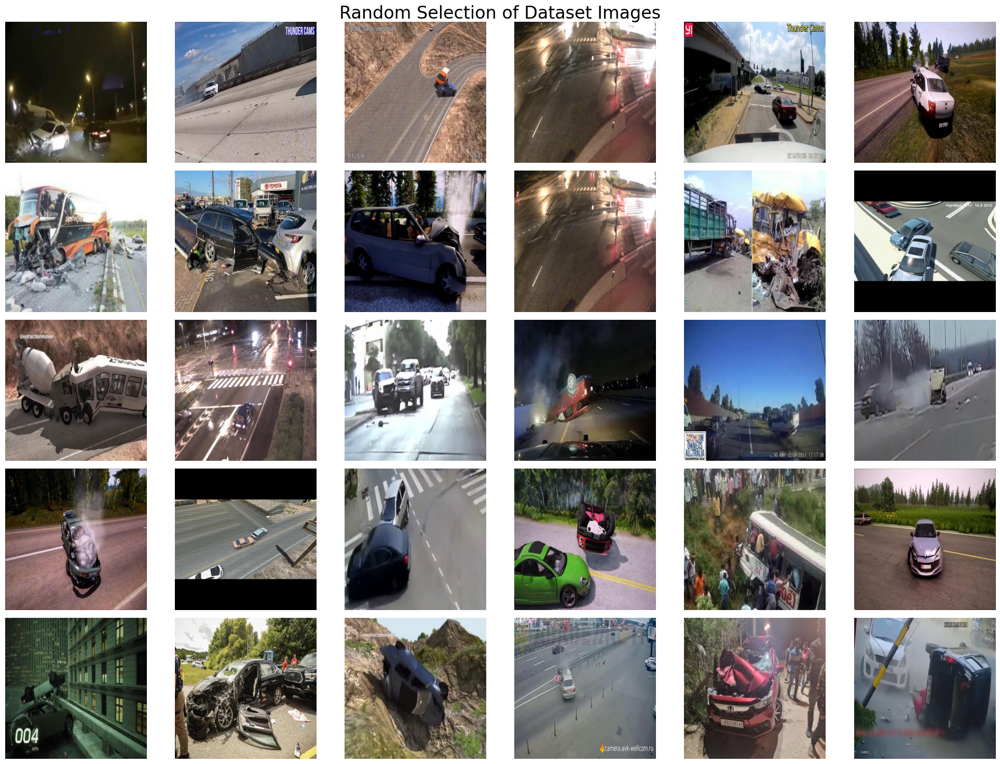

In [86]:
display_sample_images(dataset1_train_images)

- Dataset 2

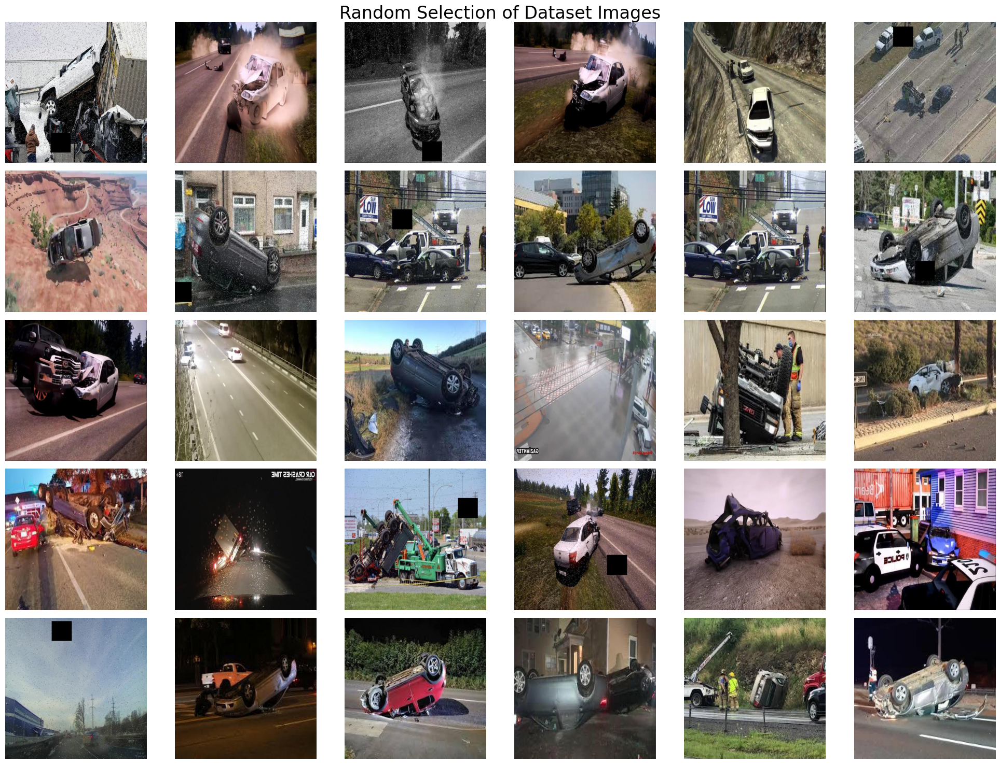

In [88]:
display_sample_images(dataset2_train_images)

#### 4.2 Display Bounding Boxes on Images

In [78]:
# Function to load annotations from annotation files
def load_annotations(label_file):
    annotations = []
    with open(label_file, 'r') as file:
        for line in file:
            # Split the line into parts
            parts = line.strip().split()
            # Convert parts to float and append to annotations list
            annotations.append([float(x) for x in parts])
    return annotations

# Function to draw bounding boxes on images
def draw_bounding_boxes(image, annotations):
    for annotation in annotations:
        # Extract annotation values
        class_id, x_center, y_center, width, height = annotation
        # Convert bounding box coordinates to integers
        left = int((x_center - width / 2) * image.shape[1])
        top = int((y_center - height / 2) * image.shape[0])
        right = int((x_center + width / 2) * image.shape[1])
        bottom = int((y_center + height / 2) * image.shape[0])
        # Draw bounding box on the image                       #RGB   #thickness
        cv2.rectangle(image, (left, top), (right, bottom), (255, 0, 0), 2 ) 
    return image 

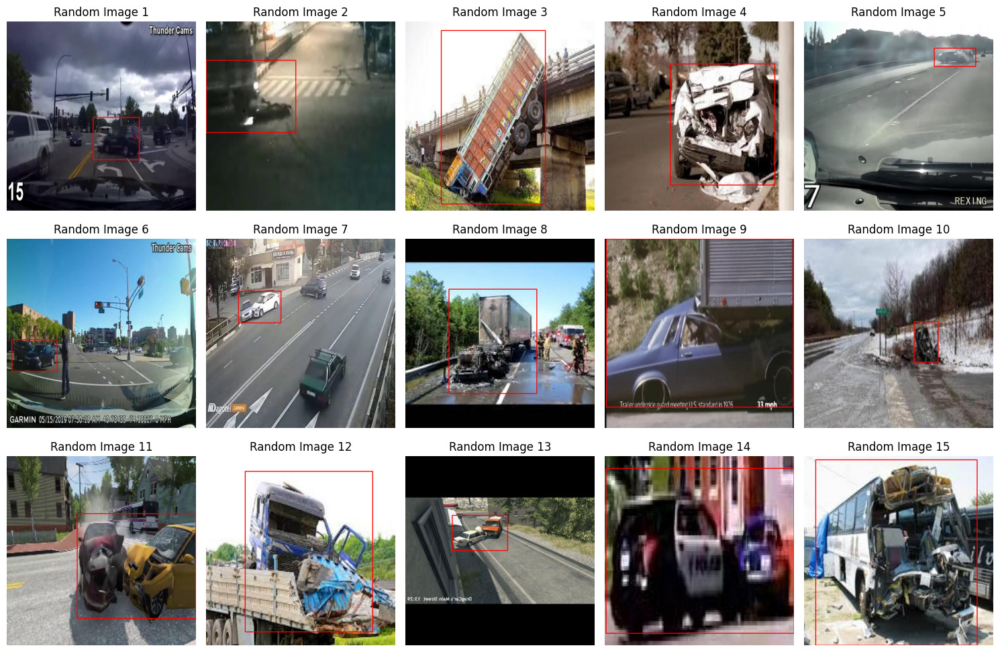

In [83]:
image_files = [f for f in os.listdir(dataset1_train_images) if f.endswith('.jpg')]

# Select 15 random image filenames
random_image_files = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(15, 10))

# Loop through each random image filename
for i, random_image_file in enumerate(random_image_files):
    # Load the corresponding annotation file
    annotation_file = os.path.join(dataset1_train_labels, random_image_file.replace('.jpg', '.txt'))
    annotations = load_annotations(annotation_file)
    
    # Load the image
    image = Image.open(os.path.join(dataset1_train_images, random_image_file))
    
    # Convert image to numpy array for Matplotlib
    image_np = plt.imread(os.path.join(dataset1_train_images, random_image_file))
    
    # Draw bounding boxes on the image
    image_with_boxes = draw_bounding_boxes(image_np, annotations)
    
    # Add a subplot for the current image
    plt.subplot(3, 5, i + 1)
    plt.imshow(image_with_boxes)
    plt.title('Random Image {}'.format(i + 1))
    plt.axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()